# **Práctica 4**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time

In [2]:
df = pd.read_csv('train_airlines.csv')

In [3]:
#Crear el etiquetado del conjunto de datos de entrenamiento
df['ARRIVE'] = [-1 if x < -15 else 1 if x > 15 else 0 for x in df['ARR_DELAY']] 
df = df.drop(['ARR_DELAY'], axis=1)

df.head()

,FL_DATE,OP_CARRIER,OP_CARRIER_FL_NUM,ORIGIN,DEST,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,TAXI_OUT,WHEELS_OFF,CRS_ARR_TIME,CRS_ELAPSED_TIME,DISTANCE,ARRIVE
0,2009-09-05,AA,2062,MIA,BOS,1055.0,1139.0,44.0,15.0,1154.0,1405.0,190.0,1258.0,1
1,2009-05-08,XE,2926,IAH,ELP,2115.0,2112.0,-3.0,17.0,2129.0,2219.0,124.0,667.0,0
2,2009-03-16,OH,6433,CVG,DSM,1430.0,1425.0,-5.0,25.0,1450.0,1518.0,108.0,505.0,0
3,2009-03-04,OO,5439,LAX,SBA,820.0,814.0,-6.0,15.0,829.0,905.0,45.0,89.0,0
4,2009-06-12,WN,615,LAS,MCI,1235.0,1234.0,-1.0,13.0,1247.0,1735.0,180.0,1140.0,-1


## **Análisis exploratorio**

In [4]:
#Listado de atributos y sus tipos
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9000000 entries, 0 to 8999999
Data columns (total 14 columns):
 #   Column             Dtype  
---  ------             -----  
 0   FL_DATE            object 
 1   OP_CARRIER         object 
 2   OP_CARRIER_FL_NUM  int64  
 3   ORIGIN             object 
 4   DEST               object 
 5   CRS_DEP_TIME       float64
 6   DEP_TIME           float64
 7   DEP_DELAY          float64
 8   TAXI_OUT           float64
 9   WHEELS_OFF         float64
 10  CRS_ARR_TIME       float64
 11  CRS_ELAPSED_TIME   float64
 12  DISTANCE           float64
 13  ARRIVE             int64  
dtypes: float64(8), int64(2), object(4)
memory usage: 961.3+ MB


In [5]:
#Cantidad de instancias
df.shape[0]

9000000

In [6]:
#Cantidad de valores nulos
df.isnull().sum()

FL_DATE              0
OP_CARRIER           0
OP_CARRIER_FL_NUM    0
ORIGIN               0
DEST                 0
CRS_DEP_TIME         0
DEP_TIME             0
DEP_DELAY            0
TAXI_OUT             0
WHEELS_OFF           0
CRS_ARR_TIME         0
CRS_ELAPSED_TIME     0
DISTANCE             0
ARRIVE               0
dtype: int64

In [7]:
#Total de valores distintos
df.nunique()

FL_DATE              3225
OP_CARRIER             21
OP_CARRIER_FL_NUM    7538
ORIGIN                352
DEST                  351
CRS_DEP_TIME         1400
DEP_TIME             1440
DEP_DELAY            1352
TAXI_OUT              230
WHEELS_OFF           1440
CRS_ARR_TIME         1440
CRS_ELAPSED_TIME      649
DISTANCE             1653
ARRIVE                  3
dtype: int64

In [8]:
#Valores mínimos en cada atributo
df.min()

FL_DATE              2009-01-01
OP_CARRIER                   9E
OP_CARRIER_FL_NUM             1
ORIGIN                      ABE
DEST                        ABE
CRS_DEP_TIME                1.0
DEP_TIME                    1.0
DEP_DELAY                -234.0
TAXI_OUT                    1.0
WHEELS_OFF                  1.0
CRS_ARR_TIME                1.0
CRS_ELAPSED_TIME           18.0
DISTANCE                   31.0
ARRIVE                       -1
dtype: object

In [9]:
#Valores máximos en cada atributo
df.max()

FL_DATE              2017-12-31
OP_CARRIER                   YV
OP_CARRIER_FL_NUM          9320
ORIGIN                      YUM
DEST                        YUM
CRS_DEP_TIME             2359.0
DEP_TIME                 2400.0
DEP_DELAY                1805.0
TAXI_OUT                  297.0
WHEELS_OFF               2400.0
CRS_ARR_TIME             2400.0
CRS_ELAPSED_TIME          718.0
DISTANCE                 4983.0
ARRIVE                        1
dtype: object

In [10]:
#Aerolíneas registradas
df['OP_CARRIER'].unique()

array(['AA', 'XE', 'OH', 'OO', 'WN', 'EV', 'YV', 'NW', 'UA', 'MQ', 'F9',
       'US', 'FL', 'CO', 'AS', 'DL', 'B6', 'HA', '9E', 'VX', 'NK'],
      dtype=object)

In [11]:
#Verifica vuelos redundantes
df[df['ORIGIN'] == df['DEST']].shape[0]

0

## **Limpieza**

In [12]:
#Borrar instancias duplicadas
initial_size = df.shape[0]
df.drop_duplicates()
final_size = df.shape[0]

initial_size - final_size

0

In [13]:
#Borrar los vuelos que se retrasan más de un día
initial_size = df.shape[0]
df = df[df['DEP_DELAY'] < 1440]
final_size = df.shape[0]

initial_size - final_size

57

El conjunto de datos venía bastante limpio, por lo que no hay mucho por hacer en la limpieza. No se ven valores anormales, duplicados ni nulos.

## **Procesamiento de datos**

Hay ciertos vuelos que están programados en las últimas horas del día, lo que hace que algunas veces, los atributos *DEP_TIME*, *WHEELS_OFF* y *CRS_ARR_TIME*, muestren una hora menor (de madrugada) pero del siguiente día. Por otra parte, también sucede que los vuelos programados en la madrugada salgan un día antes porque va anticipado. Vamos a buscar regular estos parámetros de forma en que se agregarán o quitarán 24 hrs de acuerdo al caso que se de, entendiendo que si un atributo tiene un valor menor a 0, significa que es una hora del día anterior y si tiene valor mayor a 2400, es una hora del día siguiente. Así, todos los atributos que muestren la hora, mostrarán un mejor comportamiento gráfico.

In [14]:
df2 = df

#Ajuste de los vuelos con movimientos un día después al programado
df2['DEP_TIME'] = df2['DEP_TIME'] + 2400 * (df2['CRS_DEP_TIME'] > df2['DEP_TIME']) * (df2['DEP_DELAY'] > 0) 
df2['WHEELS_OFF'] = df2['WHEELS_OFF'] + 2400 * (df2['DEP_TIME'] > df2['WHEELS_OFF'])
df2['CRS_ARR_TIME'] = df2['CRS_ARR_TIME'] + 2400 * (df2['CRS_DEP_TIME'] > df2['CRS_ARR_TIME'])  

#Ajustes de los vuelos con movimientos un día antes al programado
df2['DEP_TIME'] = df2['DEP_TIME'] - 2400 * (df2['CRS_DEP_TIME'] < df2['DEP_TIME']) * (df2['DEP_DELAY'] < 0) 
df2['WHEELS_OFF'] = df2['WHEELS_OFF'] - 2400 * (df2['DEP_TIME'] < 0)

Por otra parte, los atributos que muestran la hora están guardados como valores numéricos, por lo que hay huecos en los rangos [HH60, HH99] para cualquier hora HH del día. Por esto pasaremos la hora a minutos del día, teniendo un total de 1440 minutos como referencia.

In [15]:
#cambio de los formatos HHMM a minutos.
df2['CRS_DEP_TIME'] = df2['CRS_DEP_TIME'] % 100 + (df2['CRS_DEP_TIME'] // 100) * 60
df2['DEP_TIME'] = df2['DEP_TIME'] % 100 + (df2['DEP_TIME'] // 100) * 60
df2['WHEELS_OFF'] = df2['WHEELS_OFF'] % 100 + (df2['WHEELS_OFF'] // 100) * 60
df2['CRS_ARR_TIME'] = df2['CRS_ARR_TIME'] % 100 + (df2['CRS_ARR_TIME'] // 100) * 60

df2[df2['CRS_DEP_TIME'] > 1420].head(10)

,FL_DATE,OP_CARRIER,OP_CARRIER_FL_NUM,ORIGIN,DEST,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,TAXI_OUT,WHEELS_OFF,CRS_ARR_TIME,CRS_ELAPSED_TIME,DISTANCE,ARRIVE
44,2009-06-13,B6,727,JFK,BQN,1439.0,1438.0,-1.0,33.0,1471.0,1664.0,225.0,1576.0,0
1392,2009-01-28,DL,1092,LAS,ATL,1430.0,1424.0,-6.0,15.0,1439.0,1834.0,224.0,1747.0,-1
3962,2009-02-13,US,1538,PHX,PHL,1430.0,1654.0,224.0,10.0,1664.0,1803.0,253.0,2075.0,1
4464,2009-09-05,AS,195,ANC,FAI,1435.0,1430.0,-5.0,8.0,1438.0,1489.0,54.0,261.0,0
4571,2009-12-27,NW,2222,HNL,SFO,1435.0,1434.0,-1.0,23.0,1457.0,1875.0,320.0,2399.0,0
6384,2009-09-23,AA,30,LAX,JFK,1430.0,1428.0,-2.0,17.0,1445.0,1935.0,325.0,2475.0,0
6672,2009-04-27,DL,1002,SLC,JFK,1435.0,1434.0,-1.0,11.0,1445.0,1817.0,262.0,1989.0,-1
6709,2009-01-21,US,125,HNL,PHX,1435.0,1429.0,-6.0,21.0,1450.0,1969.0,354.0,2918.0,-1
8765,2009-12-20,UA,968,LAS,ORD,1422.0,1419.0,-3.0,13.0,1432.0,1760.0,218.0,1515.0,-1
9102,2009-11-28,DL,1548,LAX,CVG,1435.0,1430.0,-5.0,18.0,1448.0,1864.0,249.0,1900.0,-1


## **Extracción y aumento de características**

En vista de que hay pocos atributos, más que una extracción se hará un aumento de características con cuatro documentos adicionales: *airlines.csv*, *airports.csv*, *timezones.csv* y *dst.csv*. Esto con el fin de poder identificar a donde pertenecen todas las aerolíneas, y agregar más atributos como la ciudad del aeropuerto, el uso horario del aeropuerto origen y destino, diferencias de horarios, entre otros.

In [16]:
airlines_df = pd.read_csv('airlines.csv')

In [17]:
airlines_df.head()

,ID,NAME,,IATA,ICAO,CALLSIGN,COUNTRY,ACTIVE
0,1,Private flight,\N,-,NaN,NaN,NaN,Y
1,2,135 Airways,\N,NaN,GNL,GENERAL,United States,N
2,3,1Time Airline,\N,1T,RNX,NEXTIME,South Africa,Y
3,4,2 Sqn No 1 Elementary Flying Training School,\N,NaN,WYT,NaN,United Kingdom,N
4,5,213 Flight Unit,\N,NaN,TFU,NaN,Russia,N


In [18]:
#Verifica si todas las aerolíneas existen según el código IATA.
pd.Series(df['OP_CARRIER'].unique()).isin(airlines_df['IATA'])

0     True
1     True
2     True
3     True
4     True
5     True
6     True
7     True
8     True
9     True
10    True
11    True
12    True
13    True
14    True
15    True
16    True
17    True
18    True
19    True
20    True
dtype: bool

In [19]:
df3 = df2

#Cambia el atributo OP_CARRIER a un atributo numérico
airlinesList = airlines_df['IATA'].unique().tolist()
df3['OP_CARRIER'] = [airlinesList.index(x) for x in df3['OP_CARRIER']]
df3['OP_CARRIER'] = df3['OP_CARRIER'].astype('int64')

In [20]:
airports_df = pd.read_csv('airports.csv')
airports_df.head()

,code,icao,name,latitude,longitude,elevation,url,time_zone,city_code,country,city,state,county,type
0,AAA,NTGA,Anaa,-17.350665,-145.511120,36,NaN,Pacific/Tahiti,AAA,PF,NaN,NaN,NaN,AP
1,AAB,YARY,Arrabury Airport,-26.696783,141.049092,328,NaN,Australia/Brisbane,AAB,AU,Tanbar,Queensland,Barcoo Shire,AP
2,AAC,HEAR,El Arish International Airport,31.074284,33.829172,85,NaN,Africa/Cairo,AAC,EG,Arish,Muhafazat Shamal Sina',NaN,AP
3,AAD,HCAD,Adado Airport,6.096286,46.637708,980,NaN,Africa/Khartoum,AAD,SO,Adado,NaN,NaN,AP
4,AAE,DABB,Les Salines Airport,36.821392,7.811857,36,NaN,Africa/Algiers,AAE,DZ,El Hadjar,Annaba,NaN,AP


In [21]:
timezone_df = pd.read_csv('timezones.csv')
timezone_df.head()

,timezone,offset,offset_dst
0,Africa/Abidjan,0,0
1,Africa/Accra,0,0
2,Africa/Addis_Ababa,10800,10800
3,Africa/Algiers,3600,3600
4,Africa/Asmara,10800,10800


In [22]:
#Cambia los atributos de segundos a horas
timezone_df['offset'] = timezone_df['offset'] / 60 / 60
timezone_df['offset_dst'] = timezone_df['offset_dst'] / 60 / 60

timezone_df.rename(columns={'offset': 'UTC_INVIERNO', 'offset_dst': 'UTC_VERANO', 'timezone': 'time_zone'}, inplace=True)

In [23]:
#Identifica los horarios de invierno y verano en cada aeropuerto por el huso horario
airports_df = airports_df[['code', 'time_zone', 'city', 'state']]
airports_df.rename(columns={'city': 'CITY', 'state': 'STATE'}, inplace=True)
airports_df = pd.merge(airports_df, timezone_df, on = 'time_zone', how = 'left')
airports_df = airports_df.drop(['time_zone'], axis=1)

In [24]:
#Cambia los atributos city y state a un atributo numérico
citiesList = airports_df['CITY'].unique().tolist()
statesList = airports_df['STATE'].unique().tolist()

airports_df['CITY'] = [citiesList.index(x) for x in airports_df['CITY']]
airports_df['STATE'] = [statesList.index(x) for x in airports_df['STATE']]

airports_df['CITY'] = airports_df['CITY'].astype('int64')
airports_df['STATE'] = airports_df['STATE'].astype('int64')

airports_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9770 entries, 0 to 9769
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   code          9770 non-null   object 
 1   CITY          9770 non-null   int64  
 2   STATE         9770 non-null   int64  
 3   UTC_INVIERNO  9765 non-null   float64
 4   UTC_VERANO    9765 non-null   float64
dtypes: float64(2), int64(2), object(1)
memory usage: 381.8+ KB


In [25]:
#Verifica si las claves IATA de los aeropuertos de origen existen
set(pd.Series(df3['ORIGIN'].unique())).difference(airports_df['code'])

set()

In [26]:
#Verifica si las claves IATA de los aeropuertos destino existen
set(pd.Series(df3['DEST'].unique())).difference(airports_df['code'])

set()

In [27]:
# start time
start_time_forward = time.time()

#Cambia el atributo ORIGIN a uno numérico
airportsList = airports_df['code'].unique().tolist()
airports_df['code'] = [airportsList.index(x) for x in airports_df['code']]
df3['code'] = [airportsList.index(x) for x in df3['ORIGIN']]

airports_df['code'] = airports_df['code'].astype('int64')
df3['code'] = df3['code'].astype('int64')
df3['ORIGIN'] = df3['code']

#Agrega los horarios de verano e invierno del aeropuerto origen
df3 = pd.merge(df3, airports_df, on = 'code', how = 'left')
df3.rename(columns={'UTC_VERANO': 'UTC_VERANO_ORIGEN','UTC_INVIERNO': 'UTC_INVIERNO_ORIGEN', 'CITY':'CITY_ORIGIN', 'STATE':'STATE_ORIGIN'}, inplace=True)

#Cambia el atributo DEST a uno numérico
df3['code'] = [airportsList.index(x) for x in df3['DEST']]
df3['code'] = df3['code'].astype('int64')
df3['DEST'] = df3['code']

#Agrega los horarios de verano e invierno del aeropuerto destino
df3 = pd.merge(df3, airports_df, on = 'code', how = 'left')
df3.rename(columns={'UTC_VERANO': 'UTC_VERANO_DEST','UTC_INVIERNO': 'UTC_INVIERNO_DEST', 'CITY':'CITY_DEST', 'STATE':'STATE_DEST'}, inplace=True)
df3 = df3.drop(['code'], axis=1)

# end time
end_time_forward = time.time()
time_forward = end_time_forward - start_time_forward

# show elapsed time of this method
print(f"Execution time: {time_forward:.2f} seconds")

Execution time: 448.16 seconds


In [28]:
dst_df = pd.read_csv('dst.csv')
dst_df.head()

,year,start,end
0,2009,2009-03-08,2009-11-01
1,2010,2010-03-14,2010-11-07
2,2011,2011-03-13,2011-11-06
3,2012,2012-03-11,2012-11-04
4,2013,2013-03-10,2013-11-03


In [29]:
#Une las fechas del horario de verano por el año en el atributo FL_DATE
df3['year'] = df3['FL_DATE'].str[:4].astype(int)
dst_df['year'] = dst_df['year'].astype(int)
df3 = pd.merge(df3, dst_df, on = 'year', how = 'left')

df3.head()

,FL_DATE,OP_CARRIER,OP_CARRIER_FL_NUM,ORIGIN,DEST,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,TAXI_OUT,WHEELS_OFF,...,STATE_ORIGIN,UTC_INVIERNO_ORIGEN,UTC_VERANO_ORIGEN,CITY_DEST,STATE_DEST,UTC_INVIERNO_DEST,UTC_VERANO_DEST,year,start,end
0,2009-09-05,9,2062,5089,923,655.0,699.0,44.0,15.0,714.0,...,4,-5.0,-4.0,618,40,-5.0,-4.0,2009,2009-03-08,2009-11-01
1,2009-05-08,427,2926,3341,2207,1275.0,1272.0,-3.0,17.0,1289.0,...,0,-6.0,-5.0,1493,46,-7.0,-6.0,2009,2009-03-08,2009-11-01
2,2009-03-16,356,6433,1675,2020,870.0,865.0,-5.0,25.0,890.0,...,415,-5.0,-4.0,1368,111,-6.0,-5.0,2009,2009-03-08,2009-11-01
3,2009-03-04,795,5439,4417,7184,500.0,494.0,-6.0,15.0,509.0,...,48,-8.0,-7.0,4977,48,-8.0,-7.0,2009,2009-03-08,2009-11-01
4,2009-06-12,765,615,4412,4942,755.0,754.0,-1.0,13.0,767.0,...,0,-8.0,-7.0,3350,358,-6.0,-5.0,2009,2009-03-08,2009-11-01


In [30]:
#Convierte los atributos start, end  y FL_DATE en fechas
df3['start'] = pd.to_datetime(df3['start'])
df3['end'] = pd.to_datetime(df3['end'])
df3['FL_DATE'] = pd.to_datetime(df3['FL_DATE'])

#Crea el atributo VERANO: 1 si es horario de verano y 0 si es horario de invierno. 
df3['VERANO'] = (df3['FL_DATE'] >= df3['start']) * (df3['FL_DATE'] <= df3['end'])
df3['VERANO'] = df3['VERANO'].astype(int)

#Define el horario UTC de acuerdo a VERANO
df3['UTC_ORIGEN'] = (df3['FL_DATE'] >= df3['start']) * (df3['FL_DATE'] <= df3['end']) * df3['UTC_VERANO_ORIGEN'] + ((df3['FL_DATE'] <= df3['start']) + (df3['FL_DATE'] >= df3['end'])) * df3['UTC_INVIERNO_ORIGEN']
df3['UTC_DEST'] = (df3['FL_DATE'] >= df3['start']) * (df3['FL_DATE'] <= df3['end']) * df3['UTC_VERANO_DEST'] + ((df3['FL_DATE'] <= df3['start']) + (df3['FL_DATE'] >= df3['end'])) * df3['UTC_INVIERNO_DEST']

#Se crea el atributo de DIFERENCIA_HORARIA entre dos aeropuertos según el día de vuelo
df3['DIFERENCIA_HORARIA'] = (df3['UTC_DEST'] - df3['UTC_ORIGEN']) * 60

#Elimina los atributos auxiliares que ya no se van a necesitar
df3 = df3.drop(['UTC_VERANO_ORIGEN', 'UTC_INVIERNO_ORIGEN', 'UTC_VERANO_DEST', 'UTC_INVIERNO_DEST', 'year', 'start', 'end'], axis=1)

df3.head()

,FL_DATE,OP_CARRIER,OP_CARRIER_FL_NUM,ORIGIN,DEST,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,TAXI_OUT,WHEELS_OFF,...,DISTANCE,ARRIVE,CITY_ORIGIN,STATE_ORIGIN,CITY_DEST,STATE_DEST,VERANO,UTC_ORIGEN,UTC_DEST,DIFERENCIA_HORARIA
0,2009-09-05,9,2062,5089,923,655.0,699.0,44.0,15.0,714.0,...,1258.0,1,3446,4,618,40,1,-4.0,-4.0,0.0
1,2009-05-08,427,2926,3341,2207,1275.0,1272.0,-3.0,17.0,1289.0,...,667.0,0,0,0,1493,46,1,-5.0,-6.0,-60.0
2,2009-03-16,356,6433,1675,2020,870.0,865.0,-5.0,25.0,890.0,...,505.0,0,1146,415,1368,111,1,-4.0,-5.0,-60.0
3,2009-03-04,795,5439,4417,7184,500.0,494.0,-6.0,15.0,509.0,...,89.0,0,2973,48,4977,48,0,-8.0,-8.0,0.0
4,2009-06-12,765,615,4412,4942,755.0,754.0,-1.0,13.0,767.0,...,1140.0,-1,0,0,3350,358,1,-7.0,-5.0,120.0


## **Más análisis exploratorio**

Como son una gran cantidad de instancias las que se manejan, tomaremos una muestra aleatoria de 5,000 instancias, de forma simbólica, en busca de visualizar alguna característica interesante.

In [31]:
#Listado de los atributos en el dataframe
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8999943 entries, 0 to 8999942
Data columns (total 22 columns):
 #   Column              Dtype         
---  ------              -----         
 0   FL_DATE             datetime64[ns]
 1   OP_CARRIER          int64         
 2   OP_CARRIER_FL_NUM   int64         
 3   ORIGIN              int64         
 4   DEST                int64         
 5   CRS_DEP_TIME        float64       
 6   DEP_TIME            float64       
 7   DEP_DELAY           float64       
 8   TAXI_OUT            float64       
 9   WHEELS_OFF          float64       
 10  CRS_ARR_TIME        float64       
 11  CRS_ELAPSED_TIME    float64       
 12  DISTANCE            float64       
 13  ARRIVE              int64         
 14  CITY_ORIGIN         int64         
 15  STATE_ORIGIN        int64         
 16  CITY_DEST           int64         
 17  STATE_DEST          int64         
 18  VERANO              int64         
 19  UTC_ORIGEN          float64       
 20  UT

In [32]:
df3.describe()

,FL_DATE,OP_CARRIER,OP_CARRIER_FL_NUM,ORIGIN,DEST,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,TAXI_OUT,WHEELS_OFF,...,DISTANCE,ARRIVE,CITY_ORIGIN,STATE_ORIGIN,CITY_DEST,STATE_DEST,VERANO,UTC_ORIGEN,UTC_DEST,DIFERENCIA_HORARIA
count,8999943,8.999943e+06,8.999943e+06,8.999943e+06,8.999943e+06,8.999943e+06,8.999943e+06,8.999943e+06,8.999943e+06,8.999943e+06,...,8.999943e+06,8.999943e+06,8.999943e+06,8.999943e+06,8.999943e+06,8.999943e+06,8.999943e+06,8.999943e+06,8.999943e+06,8.999943e+06
mean,2013-07-01 14:14:57.060882176,5.030795e+02,2.245580e+03,4.033838e+03,4.033366e+03,8.063663e+02,8.152457e+02,8.879451e+00,1.581326e+01,8.310686e+02,...,7.889841e+02,2.887796e-03,2.445104e+03,1.005871e+02,2.444920e+03,1.007071e+02,6.683735e-01,-5.564494e+00,-5.564194e+00,1.801345e-02
min,2009-01-01 00:00:00,9.000000e+00,1.000000e+00,3.000000e+01,3.000000e+01,1.000000e+00,-1.200000e+01,-2.340000e+02,1.000000e+00,-2.000000e+00,...,3.100000e+01,-1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-2.000000e+01,-2.000000e+01,-2.400000e+03
25%,2011-04-04 00:00:00,1.520000e+02,6.970000e+02,1.828000e+03,1.828000e+03,5.630000e+02,5.680000e+02,-5.000000e+00,1.000000e+01,5.840000e+02,...,3.540000e+02,0.000000e+00,6.960000e+02,4.000000e+00,6.960000e+02,4.000000e+00,0.000000e+00,-7.000000e+00,-7.000000e+00,0.000000e+00
50%,2013-07-02 00:00:00,5.510000e+02,1.684000e+03,4.412000e+03,4.412000e+03,8.000000e+02,8.090000e+02,-2.000000e+00,1.400000e+01,8.240000e+02,...,6.220000e+02,0.000000e+00,2.272000e+03,4.800000e+01,2.272000e+03,4.800000e+01,1.000000e+00,-5.000000e+00,-5.000000e+00,0.000000e+00
75%,2015-09-30 00:00:00,7.650000e+02,3.467000e+03,6.110000e+03,6.110000e+03,1.045000e+03,1.055000e+03,7.000000e+00,1.800000e+01,1.071000e+03,...,1.020000e+03,0.000000e+00,4.160000e+03,1.430000e+02,4.160000e+03,1.430000e+02,1.000000e+00,-4.000000e+00,-4.000000e+00,0.000000e+00
max,2017-12-31 00:00:00,8.700000e+02,9.320000e+03,9.541000e+03,9.541000e+03,1.439000e+03,2.690000e+03,1.439000e+03,2.970000e+02,2.695000e+03,...,4.983000e+03,1.000000e+00,6.678000e+03,1.759000e+03,6.678000e+03,1.759000e+03,1.000000e+00,2.000000e+01,2.000000e+01,2.400000e+03
std,NaN,3.053962e+02,1.877308e+03,2.423327e+03,2.423725e+03,2.845259e+02,2.909999e+02,3.583341e+01,9.185784e+00,2.913266e+02,...,5.947798e+02,5.988637e-01,1.892050e+03,1.528703e+02,1.892110e+03,1.532304e+02,4.707976e-01,1.457848e+00,1.457005e+00,7.046179e+01


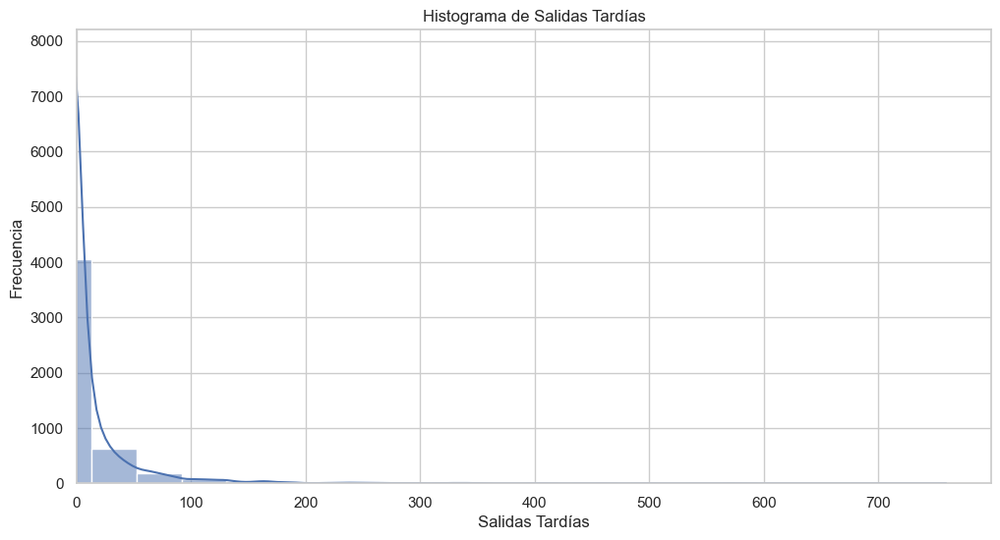

In [33]:
df_graph = df3.sample(n=5000, replace=False, weights=None, random_state=42)

sns.set(style='whitegrid')
plt.figure(figsize=(12, 6))
sns.histplot(df_graph['DEP_DELAY'], bins=20, kde=True) 
plt.title('Histograma de Salidas Tardías')
plt.xlabel('Salidas Tardías')
plt.ylabel('Frecuencia')
plt.xlim(left=0)
plt.show()

In [34]:
#Porcentage de vuelos que llegaron tarde
A = df3[df3['ARRIVE'] == 1].groupby(['OP_CARRIER'])['ARRIVE'].count() / df3.groupby(['OP_CARRIER'])['ARRIVE'].count() * 100
AA = A.to_frame().reset_index()
AA.rename(columns={'ARRIVE': 'DELAY'}, inplace=True)

#Porcentage de vuelos que llegaron a tiempo
B = df3[df3['ARRIVE'] == 0].groupby(['OP_CARRIER'])['ARRIVE'].count() / df3.groupby(['OP_CARRIER'])['ARRIVE'].count() * 100
BB = B.to_frame().reset_index()
BB.rename(columns={'ARRIVE': 'ON_TIME'}, inplace=True)

#Porcentage de vuelos que llegaron antes
C = df3[df3['ARRIVE'] == -1].groupby(['OP_CARRIER'])['ARRIVE'].count() / df3.groupby(['OP_CARRIER'])['ARRIVE'].count() * 100
CC = C.to_frame().reset_index()
CC.rename(columns={'ARRIVE': 'EARLY'}, inplace=True)

#Distribución de vuelos por aerolínea
arrive = pd.merge(AA, BB, on = 'OP_CARRIER', how = 'left')
arrive = pd.merge(arrive, CC, on = 'OP_CARRIER', how = 'left')
arrive['VALIDATE'] = arrive['DELAY'] + arrive['ON_TIME'] + arrive['EARLY']
arrive

,OP_CARRIER,DELAY,ON_TIME,EARLY,VALIDATE
0,9,19.044932,61.234095,19.720973,100.0
1,113,12.400056,66.050211,21.549734,100.0
2,115,21.424644,59.616224,18.959132,100.0
3,152,20.692388,64.402856,14.904756,100.0
4,255,16.109036,68.629235,15.261730,100.0
5,356,24.440800,57.929376,17.629824,100.0
6,364,18.967505,64.818758,16.213737,100.0
7,386,14.538985,62.661903,22.799111,100.0
8,427,19.846429,66.458035,13.695536,100.0
9,454,21.307916,64.188702,14.503382,100.0


<Figure size 1200x1000 with 0 Axes>

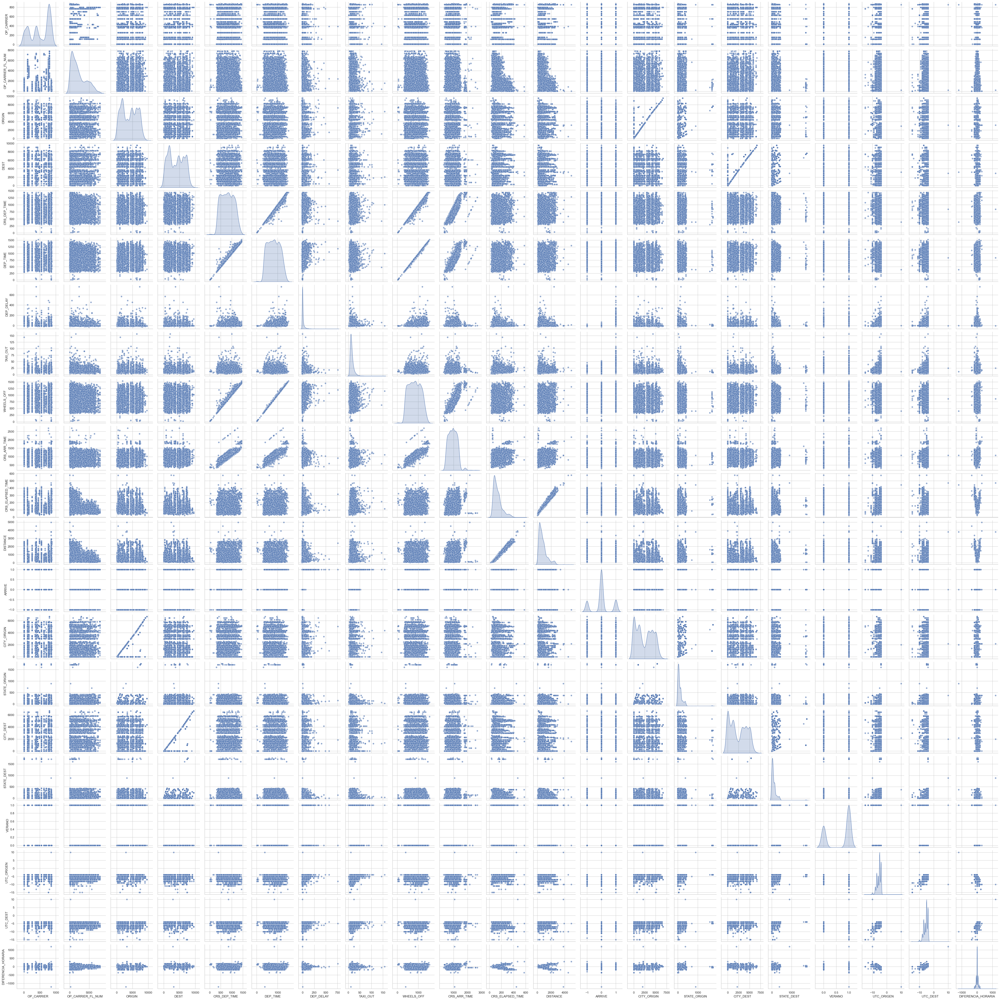

In [35]:
plt.figure(figsize=(12, 10))
sns.pairplot(df_graph, diag_kind='kde', plot_kws={'alpha': 0.6})
plt.show()

## **Selección de Características**

Como se mencionó anteriormente, hay pocas características disponibles, aún así, puede ser de valor el evaluar las correlaciones entre atributos, pero ahora lo haremos con una muestra más grande.

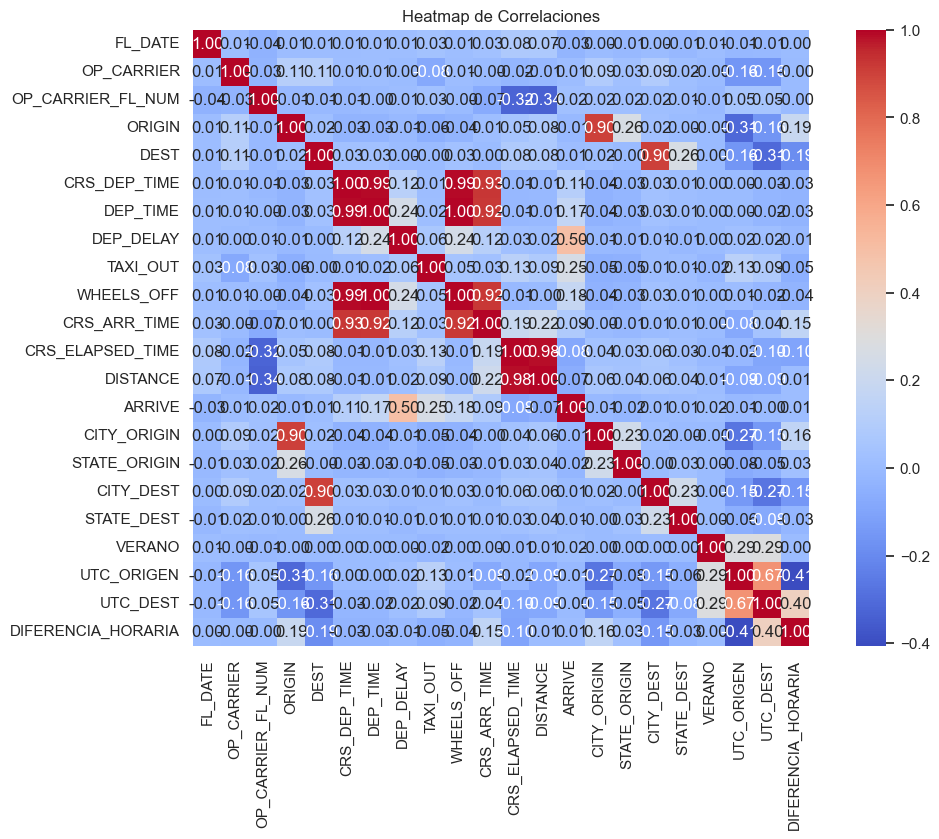

In [36]:
#Muestreo de las instancias
df_sample = df3.sample(n = 100000, replace = False, weights = None, random_state = 42)
y = df_sample['ARRIVE']
X = df_sample.drop(['FL_DATE', 'ARRIVE'], axis=1)

#Crea la matriz de correlaciones
correlation_matrix = df_sample.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, cbar=True)
plt.title('Heatmap de Correlaciones')
plt.show()

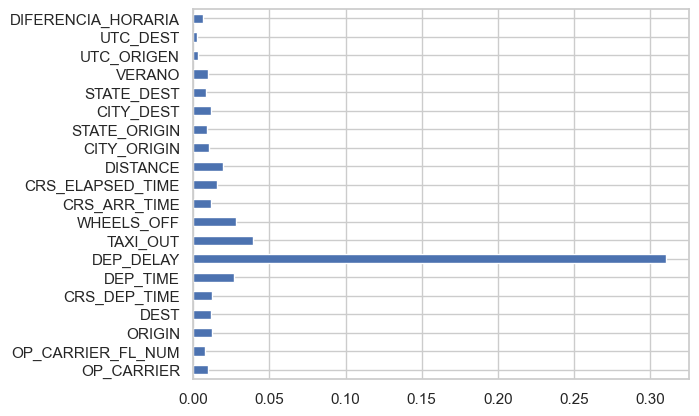

In [37]:
import time
from sklearn.feature_selection import mutual_info_classif

### Applying feature selection method
X_new = mutual_info_classif(X, y)

# plot feature selection
feat_imp = pd.Series(X_new, index=X.columns)
feat_imp.plot(kind='barh')
plt.show()

## **Algoritmos de inferencia**

In [38]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, confusion_matrix, ConfusionMatrixDisplay, recall_score
from sklearn.linear_model import Lasso, RidgeClassifier, LogisticRegression
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier
from sklearn.tree import ExtraTreeClassifier, DecisionTreeClassifier
from sklearn.naive_bayes import BernoulliNB, GaussianNB
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier

In [39]:
#Muestreo del conjunto de entrenamiento
df_sample = df3.sample(n = 1000000, replace = False, weights = None, random_state = 42)
X = df_sample.drop(['FL_DATE', 'ARRIVE'], axis=1)
y = df_sample['ARRIVE']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

y_test = pd.DataFrame(y_test, columns = ['ARRIVE']).reset_index().drop(['index'], axis=1)
y_test.rename(columns={'ARRIVE': 'TEST'}, inplace=True)

In [40]:
# Función para evaluar los modelos
def evaluate_model(model, y_test, y_pred_test, model_name):

    #Valores de la matriz de confusión
    cm = confusion_matrix(y_test, y_pred_test)
    FP = cm.sum(axis = 0) - np.diag(cm)
    FN = cm.sum(axis = 1) - np.diag(cm)
    TP = np.diag(cm)
    TN = cm.sum() - (FP + FN + TP)
    TNR = TN / (TN + FP)

    #Métricas de rendimiento
    print(f'Model: {model_name}')
    print(f'F1 score macro (test): {f1_score(y_test, y_pred_test, average='macro'):.4f}')
    print(f'Sensibilidad (test): {recall_score(y_test, y_pred_test, average= 'macro'):.4f}')
    print(f'Especificidad (test): ', TNR)
    print('-'*40)
        
    #Matriz de confusión
    ConfusionMatrixDisplay(confusion_matrix = cm).plot()
    plt.title(f"Matriz de confusion - {model_name} (TEST)")
    plt.show()

## Naive - Bayes (Bernoulli)

Model: Bernoulli Naive Bayes
F1 score macro (test): 0.2604
Sensibilidad (test): 0.3334
Especificidad (test):  [1.00000000e+00 5.56777373e-05 9.99963339e-01]
----------------------------------------


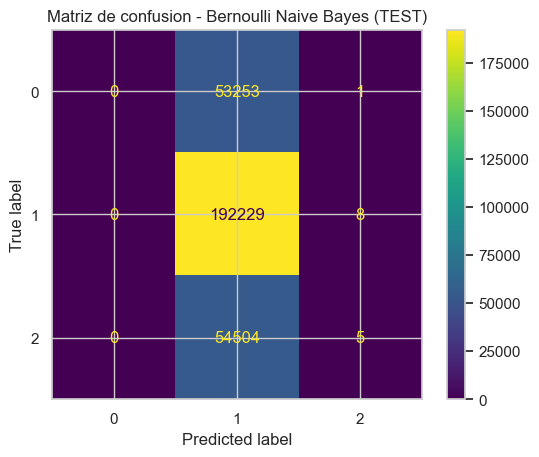

In [41]:
#Entrenamiento de Naive Bayes (Bernoulli)
bnb = BernoulliNB()
bnb.fit(X_train, y_train)

y_pred_test = bnb.predict(X_test)
y_pred_test = pd.DataFrame(y_pred_test, columns = ['PRED_TEST'])

evaluate_model(bnb, y_test, y_pred_test, 'Bernoulli Naive Bayes')

## Naive - Bayes (Gaussian)

Model: Gaussian Naive Bayes
F1 score macro (test): 0.6344
Sensibilidad (test): 0.6277
Especificidad (test):  [0.92754492 0.53019125 0.9574852 ]
----------------------------------------


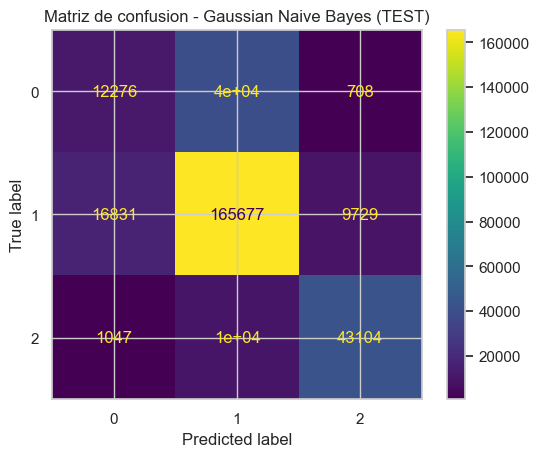

In [42]:
#Entrenamiento de Naive Bayes (Gaussian)
gnb = GaussianNB()
gnb.fit(X_train, y_train)

y_pred_test = gnb.predict(X_test)
y_pred_test = pd.DataFrame(y_pred_test, columns = ['PRED_TEST'])

evaluate_model(gnb, y_test, y_pred_test, 'Gaussian Naive Bayes')

## Regresión Logística

In [43]:
#Muestreo del conjunto de entrenamiento
df_sample = df3.sample(n = 400000, replace = False, weights = None, random_state = 42)
X = df_sample.drop(['FL_DATE', 'ARRIVE'], axis=1)
y = df_sample['ARRIVE']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

y_test = pd.DataFrame(y_test, columns = ['ARRIVE']).reset_index().drop(['index'], axis=1)
y_test.rename(columns={'ARRIVE': 'TEST'}, inplace=True)

Model: Regresión Logística
F1 score macro (test): 0.5272
Sensibilidad (test): 0.5333
Especificidad (test):  [0.99545404 0.31275882 0.99152974]
----------------------------------------


C:\Users\Usuario\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


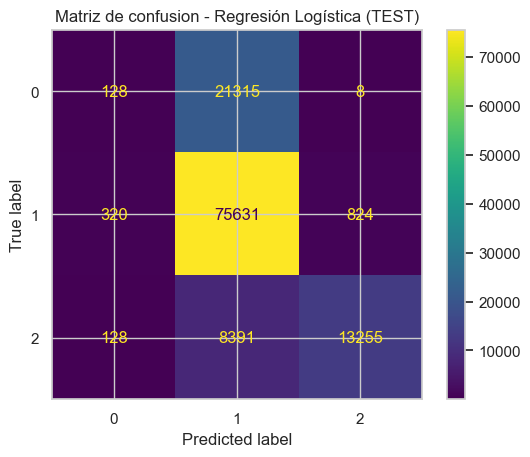

In [44]:
#Entrenamiento de Regresión Logística
lr = LogisticRegression(random_state=0).fit(X_train, y_train)

y_pred_test = lr.predict(X_test)
y_pred_test = pd.DataFrame(y_pred_test, columns = ['PRED_TEST'])

evaluate_model(lr, y_test, y_pred_test, 'Regresión Logística')

## Regresión Ridge

Model: Regresión Ridge
F1 score macro (test): 0.4984
Sensibilidad (test): 0.4830
Especificidad (test):  [0.98558078 0.24071718 0.99852381]
----------------------------------------


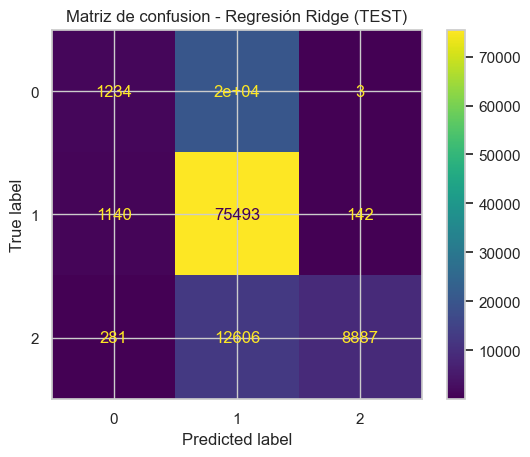

In [45]:
#Entrenamiento de Regresión Ridge
ridge = RidgeClassifier().fit(X_train, y_train)

y_pred_test = ridge.predict(X_test)
y_pred_test = pd.DataFrame(y_pred_test, columns = ['PRED_TEST'])

evaluate_model(ridge, y_test, y_pred_test, 'Regresión Ridge')

## Regresión Lasso

Model: Regresion Lasso
F1 score macro (test): 0.5807
Sensibilidad (test): 0.5420
Especificidad (test):  [0.97714842 0.33320995 0.99618227]
----------------------------------------


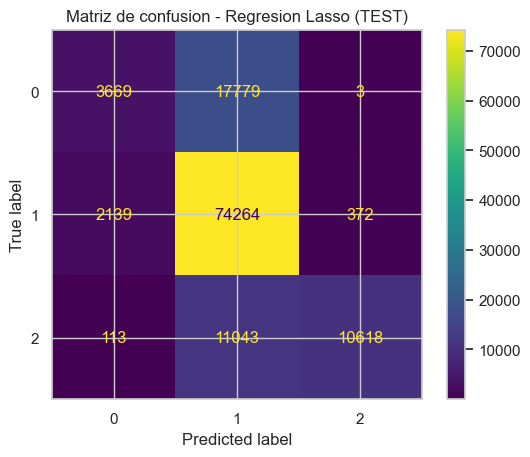

In [46]:
#Entrenamiento de Regresión Lasso
lasso_reg = Lasso(alpha=0.1, max_iter=10000)
lasso_reg.fit(X_train, y_train)

y_test = pd.DataFrame(y_test, columns = ['TEST'])

y_pred_test = lasso_reg.predict(X_test)
y_pred_test = pd.DataFrame(y_pred_test, columns = ['PRED_TEST'])
y_pred_test['PRED_TEST'] = 0 + (y_pred_test['PRED_TEST'] < -1/3) * (-1) + (y_pred_test['PRED_TEST'] > 1/3) * (1)

evaluate_model(lasso_reg, y_test, y_pred_test, 'Regresion Lasso')

## Random Forest Classifier

Model: Clasificador Random Forest
F1 score macro (test): 0.7109
Sensibilidad (test): 0.6865
Especificidad (test):  [0.9208617  0.59657606 0.98250972]
----------------------------------------


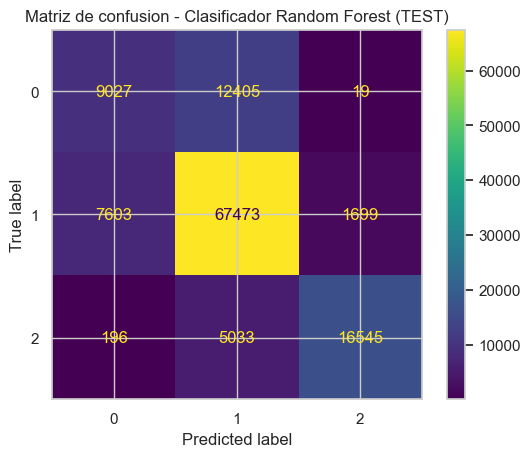

In [47]:
#Entrenamiento del clasificador Random Forest
rfc = RandomForestClassifier(n_estimators = 10, criterion = 'entropy', random_state = 42)
rfc.fit(X_train, y_train)

y_pred_test = rfc.predict(X_test)
y_pred_test = pd.DataFrame(y_pred_test, columns = ['PRED_TEST'])

evaluate_model(rfc, y_test, y_pred_test, 'Clasificador Random Forest')

## Decision Tree Classifier

Model: Decision Tree
F1 score macro (test): 0.6484
Sensibilidad (test): 0.6252
Especificidad (test):  [0.96287126 0.47491035 0.98396555]
----------------------------------------


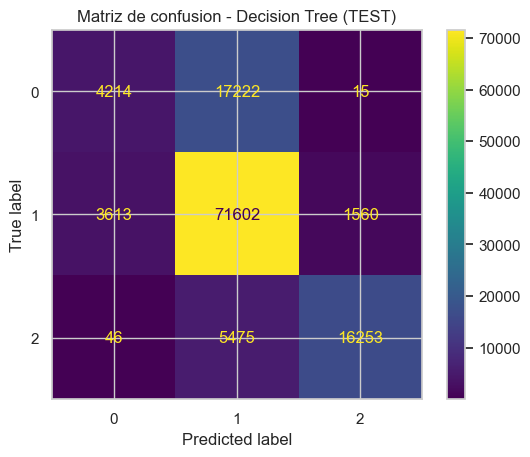

In [48]:
#Entrenamiento del Clasificador Decision Tree
dtc = DecisionTreeClassifier(max_depth = 5) 
dtc.fit(X_train, y_train)

y_pred_test = dtc.predict(X_test)
y_pred_test = pd.DataFrame(y_pred_test, columns = ['PRED_TEST'])

evaluate_model(dtc, y_test, y_pred_test, 'Decision Tree')

## Extra Randomized Tree

Model: Extra Randomized Tree
F1 score macro (test): 0.6598
Sensibilidad (test): 0.6294
Especificidad (test):  [0.92577297 0.50986698 0.98277442]
----------------------------------------


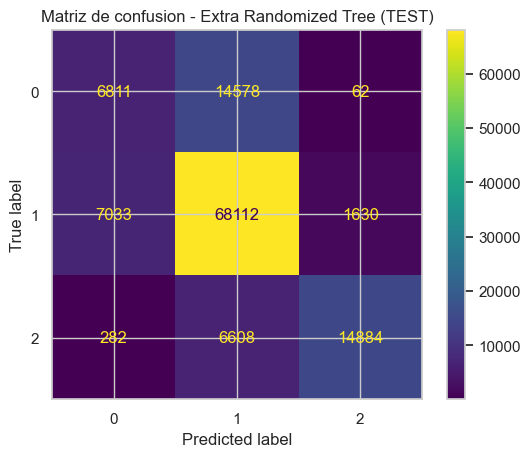

In [49]:
#Entrenamiento del clasificador Extra Randomized Tree
extra_tree = ExtraTreeClassifier(random_state=0)
ert = BaggingClassifier(extra_tree, random_state=0).fit(X_train, y_train)

y_pred_test = ert.predict(X_test)
y_pred_test = pd.DataFrame(y_pred_test, columns = ['PRED_TEST'])

evaluate_model(ert, y_test, y_pred_test, 'Extra Randomized Tree')

## Clasificador kNN

Model: kNN Classifier
F1 score macro (test): 0.3663
Sensibilidad (test): 0.3771
Especificidad (test):  [0.92928391 0.16573742 0.97201352]
----------------------------------------


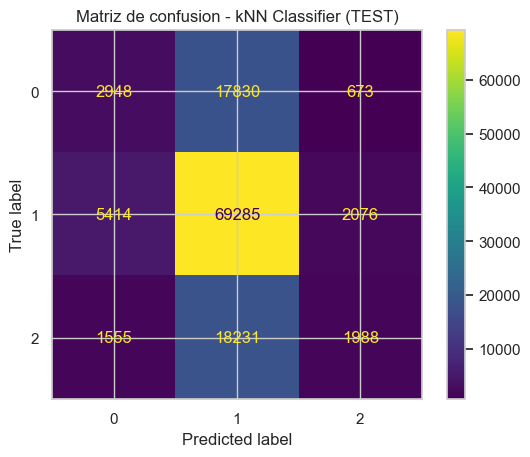

In [50]:
#Entrenamiento del clasificador por kNN
knn = KNeighborsClassifier(n_neighbors=10)
knn.fit(X_train, y_train)

y_pred_test = knn.predict(X_test)
y_pred_test = pd.DataFrame(y_pred_test, columns = ['PRED_TEST'])

evaluate_model(knn, y_test, y_pred_test, 'kNN Classifier')

##  Support Vector Machine

In [51]:
#Muestreo del conjunto de entrenamiento
df_sample = df3.sample(n = 100000, replace = False, weights = None, random_state = 42)
X = df_sample.drop(['FL_DATE', 'ARRIVE'], axis=1)
y = df_sample['ARRIVE']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

y_test = pd.DataFrame(y_test, columns = ['ARRIVE']).reset_index().drop(['index'], axis=1)
y_test.rename(columns={'ARRIVE': 'TEST'}, inplace=True)

Model: Support Vector Machine
F1 score macro (test): 0.3850
Sensibilidad (test): 0.4046
Especificidad (test):  [0.9998791  0.11018458 0.99995921]
----------------------------------------


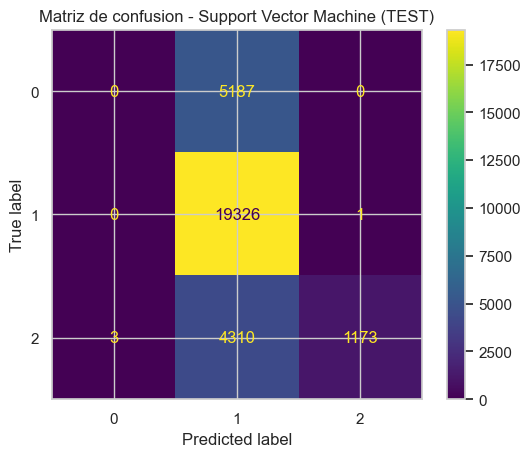

In [52]:
#Entrenamiento de Support Vector Machine
sup_vec = svm.SVC().fit(X_train, y_train)

y_pred_test = sup_vec.predict(X_test)
y_pred_test = pd.DataFrame(y_pred_test, columns = ['PRED_TEST'])

evaluate_model(sup_vec, y_test, y_pred_test, 'Support Vector Machine')

## **Predicción de vuelos**

In [53]:
test_df = pd.read_csv('test_airlines.csv')

#Ajuste de los vuelos con movimientos un día después al programado
test_df['DEP_TIME'] = test_df['DEP_TIME'] + 2400 * (test_df['CRS_DEP_TIME'] > test_df['DEP_TIME']) * (test_df['DEP_DELAY'] > 0) 
test_df['WHEELS_OFF'] = test_df['WHEELS_OFF'] + 2400 * (test_df['DEP_TIME'] > test_df['WHEELS_OFF'])
test_df['CRS_ARR_TIME'] = test_df['CRS_ARR_TIME'] + 2400 * (test_df['CRS_DEP_TIME'] > test_df['CRS_ARR_TIME'])  

#Ajustes de los vuelos con movimientos un día antes al programado
test_df['DEP_TIME'] = test_df['DEP_TIME'] - 2400 * (test_df['CRS_DEP_TIME'] < test_df['DEP_TIME']) * (test_df['DEP_DELAY'] < 0) 
test_df['WHEELS_OFF'] = test_df['WHEELS_OFF'] - 2400 * (test_df['DEP_TIME'] < 0)

#cambio de los formatos HHMM a minutos.
test_df['CRS_DEP_TIME'] = test_df['CRS_DEP_TIME'] % 100 + (test_df['CRS_DEP_TIME'] // 100) * 60
test_df['DEP_TIME'] = test_df['DEP_TIME'] % 100 + (test_df['DEP_TIME'] // 100) * 60
test_df['WHEELS_OFF'] = test_df['WHEELS_OFF'] % 100 + (test_df['WHEELS_OFF'] // 100) * 60
test_df['CRS_ARR_TIME'] = test_df['CRS_ARR_TIME'] % 100 + (test_df['CRS_ARR_TIME'] // 100) * 60

#Cambia el atributo OP_CARRIER a un atributo numérico
test_df['OP_CARRIER'] = [airlinesList.index(x) for x in test_df['OP_CARRIER']]
test_df['OP_CARRIER'] = test_df['OP_CARRIER'].astype('int64')

#Cambia el atributo ORIGIN a uno numérico
test_df['code'] = [airportsList.index(x) for x in test_df['ORIGIN']]

test_df['code'] = test_df['code'].astype('int64')
test_df['ORIGIN'] = test_df['code']

#Agrega los horarios de verano e invierno del aeropuerto origen
test_df = pd.merge(test_df, airports_df, on = 'code', how = 'left')
test_df.rename(columns={'UTC_VERANO': 'UTC_VERANO_ORIGEN','UTC_INVIERNO': 'UTC_INVIERNO_ORIGEN', 'CITY':'CITY_ORIGIN', 'STATE':'STATE_ORIGIN'}, inplace=True)

#Cambia el atributo DEST a uno numérico
test_df['code'] = [airportsList.index(x) for x in test_df['DEST']]
test_df['code'] = test_df['code'].astype('int64')
test_df['DEST'] = test_df['code']

#Agrega los horarios de verano e invierno del aeropuerto destino
test_df = pd.merge(test_df, airports_df, on = 'code', how = 'left')
test_df.rename(columns={'UTC_VERANO': 'UTC_VERANO_DEST','UTC_INVIERNO': 'UTC_INVIERNO_DEST', 'CITY':'CITY_DEST', 'STATE':'STATE_DEST'}, inplace=True)
test_df = test_df.drop(['code'], axis=1)

#Une las fechas del horario de verano por el año en el atributo FL_DATE
test_df['year'] = test_df['FL_DATE'].str[:4].astype(int)
test_df = pd.merge(test_df, dst_df, on = 'year', how = 'left')

#Convierte los atributos start, end  y FL_DATE en fechas
test_df['start'] = pd.to_datetime(test_df['start'])
test_df['end'] = pd.to_datetime(test_df['end'])
test_df['FL_DATE'] = pd.to_datetime(test_df['FL_DATE'])

#Crea el atributo VERANO: 1 si es horario de verano y 0 si es horario de invierno. 
test_df['VERANO'] = (test_df['FL_DATE'] >= test_df['start']) * (test_df['FL_DATE'] <= test_df['end'])
test_df['VERANO'] = test_df['VERANO'].astype(int)

#Define el horario UTC de acuerdo a VERANO
test_df['UTC_ORIGEN'] = (test_df['FL_DATE'] >= test_df['start']) * (test_df['FL_DATE'] <= test_df['end']) * test_df['UTC_VERANO_ORIGEN'] + ((test_df['FL_DATE'] <= test_df['start']) + (test_df['FL_DATE'] >= test_df['end'])) * test_df['UTC_INVIERNO_ORIGEN']
test_df['UTC_DEST'] = (test_df['FL_DATE'] >= test_df['start']) * (test_df['FL_DATE'] <= test_df['end']) * test_df['UTC_VERANO_DEST'] + ((test_df['FL_DATE'] <= test_df['start']) + (test_df['FL_DATE'] >= test_df['end'])) * test_df['UTC_INVIERNO_DEST']

#Se crea el atributo de DIFERENCIA_HORARIA entre dos aeropuertos según el día de vuelo
test_df['DIFERENCIA_HORARIA'] = (test_df['UTC_DEST'] - test_df['UTC_ORIGEN']) * 60

#Elimina los atributos auxiliares que ya no se van a necesitar
test_df = test_df.drop(['UTC_VERANO_ORIGEN', 'UTC_INVIERNO_ORIGEN', 'UTC_VERANO_DEST', 'UTC_INVIERNO_DEST', 'year', 'start', 'end'], axis=1)

#Elimina el atributo FL_DATE
test_df = test_df.drop(['FL_DATE'], axis=1)

In [57]:
#Predicción de los vuelos
y_predict = rfc.predict(test_df)
y_predict = pd.DataFrame(y_predict, columns = ['PREDICT'])

#Regresa los valores de predicción a texto y guarda el documento en .csv
y_predict['PREDICT'] = y_predict['PREDICT'].replace({-1: 'Early', 0: 'On Time', 1: 'Delay'})
y_predict.to_csv('prediccion.csv')
y_predict['PREDICT'].unique()

array(['On Time', 'Delay', 'Early'], dtype=object)